# Corellation between Spectra

### In this notebook I will checked the corellation between spectra in each dataset corresponding to 4 phases. The SVM scores at the low resolution of the spectral dataset are higher than expected. The spectra might still be corellated at lower resolutions, which is what I am going to check here.

In [1]:
import SNIDsn
import SNIDdataset as snid
import numpy as np
import SNePCA

import plotly.plotly as ply
import plotly.graph_objs as go
import plotly.tools as tls

import matplotlib.pyplot as plt

import pandas as pd
import seaborn
from BinSpectra import lowres_dataset
from BinSpectra import random_noise_dataset
from BinSpectra import replace_flux_with_noise
#from BinSpectra import GetTypes_dataset
import random

#warnings.filterwarnings('ignore')
#warnings.filterwarnings(action='once')
PATH = '../Data/DataProducts/'

In [19]:
def loaddata(phase):
    """
    Loads the pickled dataset
    """
    dsname = "dataset{}.pickle".format(phase)
    return snid.loadPickle(PATH + dsname)   


def remove_sne(dataset):
    dataset_key_list = list(dataset.keys())
    for key in dataset_key_list:
        if dataset[key].header['TypeStr'] == 'Ib-pec':
            del dataset[key]
        elif dataset[key].header['TypeStr'] == 'Ic-pec':
            del dataset[key]
    return dataset


def get_bin_length(phase, bin_factor):
    dataset = loaddata(phase)
    dataset_key_list = list(dataset.keys())
    wvl = dataset[dataset_key_list[0]].wavelengths
    wbin = (np.log(wvl[1]) - np.log(wvl[0])) * bin_factor
    return wbin



def runPCA(phase, bin_length, dphase=5, noise=False):
    dataset = loaddata(phase)
    if noise:
        dataset = replace_flux_with_noise(dataset)
        dataset_lowres = lowres_dataset(dataset, bin_length)
    else:
        dataset_lowres = lowres_dataset(dataset, bin_length)
    snidPCA_ph = SNePCA.SNePCA(dataset_lowres, phase - dphase, phase + dphase)
    snidPCA_ph.snidPCA()
    snidPCA_ph.calcPCACoeffs()
    return snidPCA_ph


def Dataset_df(dataset, bin_length):
    dataset = lowres_dataset(dataset, bin_length)
    dataset_key_list = list(dataset.keys())
    SNe_dict = {}
    for key in dataset_key_list:
        SNe_dict["%s (%s)"%(key, dataset[key].header['TypeStr'])] = dataset[key].data.astype('float64')
    dataframe = pd.DataFrame(data = SNe_dict)
    return dataframe

## Subtypes: Ib-norm, IIb, Ic, Ic-norm, Ic-broad

def get_subtype_index(dataset, SubType):
    #dataset = remove_sne(loaddata(phase))
    dataset_key_list = list(dataset.keys())
    SNe_subtype_Ib_index = []
    SNe_subtype_IIb_index = []
    SNe_subtype_Ic_index = []
    SNe_subtype_Icbl_index = []
    for i, n in enumerate(dataset):
        if dataset[n].header['TypeStr'] == 'Ib-norm':
            SNe_subtype_Ib_index.append(i)
        elif dataset[n].header['TypeStr'] == 'IIb':
            SNe_subtype_IIb_index.append(i)
            #print(dash_IIb)
        elif dataset[n].header['TypeStr'] == 'Ic' or dataset[n].header['TypeStr'] == 'Ic-norm':
            SNe_subtype_Ic_index.append(i)
            #print(i, dash_Ic)
        elif dataset[n].header['TypeStr'] == 'Ic-broad':
            SNe_subtype_Icbl_index.append(i)
            #print(i, dash_Icbl)
    if SubType == 1:
        SNe_subtype_index = SNe_subtype_Ib_index
    elif SubType == 2:
        SNe_subtype_index = SNe_subtype_IIb_index
    elif SubType == 3:
        SNe_subtype_index = SNe_subtype_Ic_index
    elif SubType == 4:
        SNe_subtype_index = SNe_subtype_Icbl_index
    return SNe_subtype_index


def av_corr_subtypes(dataset, bin_length):
    corr = Dataset_df(dataset, bin_length).corr()
    corrl_Ib_Ib = []
    corrl_Ib_IIb = []
    corrl_Ib_Ic = []
    corrl_Ib_Icbl = []

    corrl_IIb_IIb = []
    corrl_IIb_Ic = []
    corrl_IIb_Icbl = []

    corrl_Ic_Ic = []
    corrl_Ic_Icbl = []

    corrl_Icbl_Icbl = []
    type_Ib_index = get_subtype_index(dataset, 1)
    type_IIb_index = get_subtype_index(dataset, 2)
    type_Ic_index = get_subtype_index(dataset, 3)
    type_Icbl_index = get_subtype_index(dataset, 4)
    for i in type_Ib_index:
        corrl_ib_ib = list(corr.values[i][i+1:type_Ib_index[-1] + 1])
        corrl_ib_iib = list(corr.values[i][type_IIb_index[0]:type_IIb_index[-1] + 1])
        corrl_ib_ic = list(corr.values[i][type_Ic_index[0]:type_Ic_index[-1] + 1])
        corrl_ib_icbl = list(corr.values[i][type_Icbl_index[0]:type_Icbl_index[-1] + 1])
        corrl_Ib_Ib.append(corrl_ib_ib)
        corrl_Ib_IIb.append(corrl_ib_iib)
        corrl_Ib_Ic.append(corrl_ib_ic)
        corrl_Ib_Icbl.append(corrl_ib_icbl)
    corrl_Ib_Ib = np.array(sum(corrl_Ib_Ib, []))
    corrl_Ib_IIb = np.array(sum(corrl_Ib_IIb, []))
    corrl_Ib_Ic = np.array(sum(corrl_Ib_Ic, []))
    corrl_Ib_Icbl = np.array(sum(corrl_Ib_Icbl, []))
    for j in type_IIb_index:
        corrl_iib_iib = list(corr.values[j][j+1:type_IIb_index[-1] + 1])
        corrl_iib_ic = list(corr.values[j][type_Ic_index[0]:type_Ic_index[-1] + 1])
        corrl_iib_icbl = list(corr.values[j][type_Icbl_index[0]:type_Icbl_index[-1] + 1])
        corrl_IIb_IIb.append(corrl_iib_iib)
        corrl_IIb_Ic.append(corrl_iib_ic)
        corrl_IIb_Icbl.append(corrl_iib_icbl)
    corrl_IIb_IIb = np.array(sum(corrl_IIb_IIb, []))
    corrl_IIb_Ic = np.array(sum(corrl_IIb_Ic, []))
    corrl_IIb_Icbl = np.array(sum(corrl_IIb_Icbl, []))
    for k in type_Ic_index:
        corrl_ic_ic = list(corr.values[k][k+1:type_Ic_index[-1] + 1])
        corrl_ic_icbl = list(corr.values[k][type_Icbl_index[0]:type_Icbl_index[-1] + 1])
        corrl_Ic_Ic.append(corrl_ic_ic)
        corrl_Ic_Icbl.append(corrl_ic_icbl)
    corrl_Ic_Ic = np.array(sum(corrl_Ic_Ic, []))
    corrl_Ic_Icbl = np.array(sum(corrl_Ic_Icbl, []))
    for l in type_Icbl_index:
        corrl_icbl_icbl = list(corr.values[l][l+1:type_Icbl_index[-1] + 1])
        corrl_Icbl_Icbl.append(corrl_icbl_icbl)
    corrl_Icbl_Icbl = np.array(sum(corrl_Icbl_Icbl, []))
    print('Average Ib-Ib Correlation: %2f' %corrl_Ib_Ib.mean())
    print('Average Ib-IIb Correlation: %2f' %corrl_Ib_IIb.mean())
    print('Average Ib-Ic Correlation: %2f' %corrl_Ib_Ic.mean())
    print('Average Ib-Icbl Correlation: %2f' %corrl_Ib_Icbl.mean())
    print('Average IIb-IIb Correlation: %2f' %corrl_IIb_IIb.mean())
    print('Average IIb-Ic Correlation: %2f' %corrl_IIb_Ic.mean())
    print('Average IIb-Icbl Correlation: %2f' %corrl_IIb_Icbl.mean())
    print('Average Ic-Ic Correlation: %2f' %corrl_Ic_Ic.mean())
    print('Average Ic-Icbl Correlation: %2f' %corrl_Ic_Icbl.mean())
    print('Average Icbl-Icbl Correlation: %2f' %corrl_Icbl_Icbl.mean())
    return

## 1. Peak Phase

In [6]:
bin_length = get_bin_length(0, 1)
dataset = remove_sne(loaddata(0))
dataframe_0 = Dataset_df(dataset, bin_length)

dataframe_0.head()

,sn1998dt (Ib-norm),sn1999dn (Ib-norm),sn1999ex (Ib-norm),sn2004gq (Ib-norm),sn2005bf (Ib-norm),sn2005hg (Ib-norm),sn2007ag (Ib-norm),sn2007C (Ib-norm),sn2007kj (Ib-norm),sn2007Y (Ib-norm),...,sn2002ap (Ic-broad),sn2003jd (Ic-broad),sn2003lw (Ic-broad),sn2006aj (Ic-broad),sn2007ru (Ic-broad),sn2009bb (Ic-broad),sn2010bh (Ic-broad),sn2012ap (Ic-broad),sn2012bz (Ic-broad),sn2013dx (Ic-broad)
0,0.099465,0.105831,0.028141,0.040828,0.161510,0.229819,0.169907,0.117130,0.186637,0.206502,...,0.016992,0.036111,-0.086481,0.005182,0.064655,0.002124,0.044944,0.044446,0.013940,0.037538
1,0.089744,0.127695,0.027019,0.036800,0.207570,0.316935,0.234341,0.154501,0.230181,0.266396,...,0.009736,0.037748,-0.097774,0.006793,0.066577,0.002976,0.051356,0.040907,0.012382,0.039349
2,0.066659,0.138131,0.011669,0.028039,0.238837,0.356056,0.275778,0.178373,0.242719,0.293763,...,0.002115,0.038338,-0.107604,0.008481,0.067948,0.004643,0.057643,0.037178,0.010252,0.040402
3,0.034131,0.132217,-0.019685,0.015455,0.248519,0.339300,0.283362,0.186544,0.219410,0.283253,...,-0.005693,0.037961,-0.115716,0.010127,0.068830,0.007027,0.063538,0.033377,0.007595,0.040491
4,0.000037,0.111639,-0.063084,0.000363,0.237050,0.278688,0.254371,0.179689,0.168887,0.243121,...,-0.013493,0.036733,-0.121887,0.011605,0.069290,0.009982,0.068762,0.029624,0.004475,0.039452


## 1.1 Full resolution

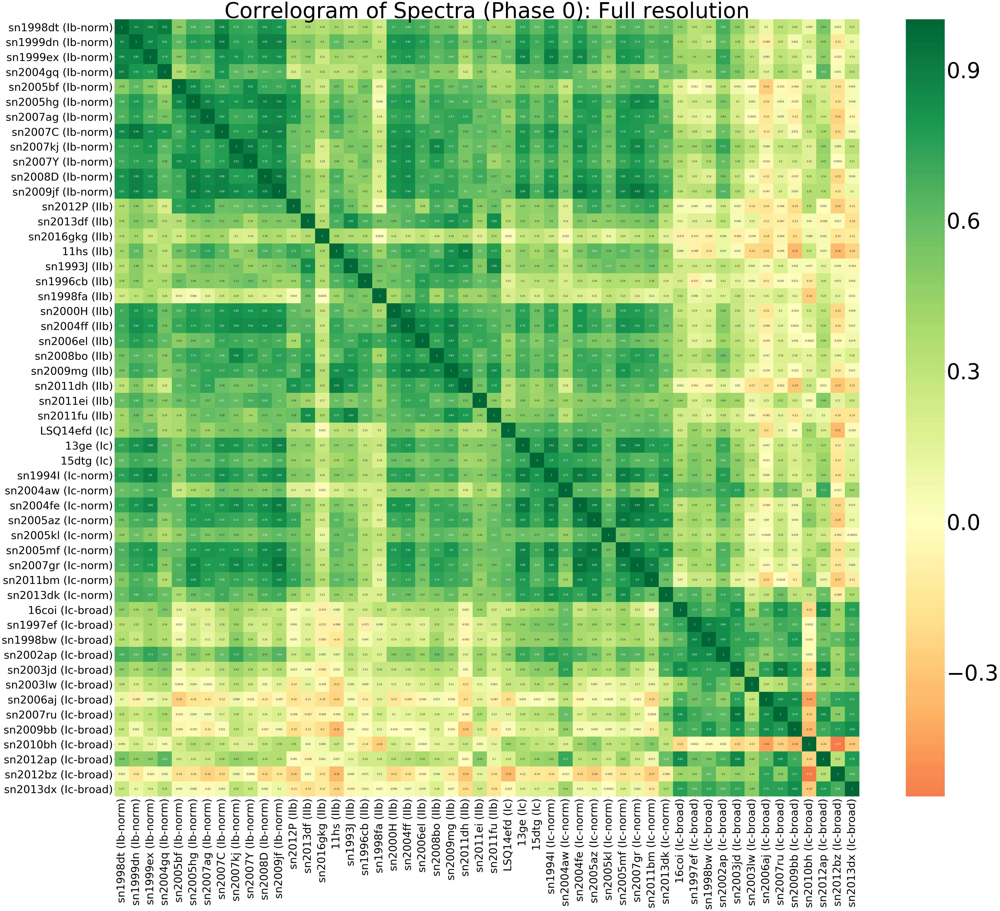

In [17]:
bin_length = get_bin_length(0, 1)
dataset = remove_sne(loaddata(0))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 0): Full resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average pairwise correlation:

In [20]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.765468
Average Ib-IIb Correlation: 0.545929
Average Ib-Ic Correlation: 0.660575
Average Ib-Icbl Correlation: 0.223077
Average IIb-IIb Correlation: 0.609956
Average IIb-Ic Correlation: 0.486640
Average IIb-Icbl Correlation: 0.090691
Average Ic-Ic Correlation: 0.726478
Average Ic-Icbl Correlation: 0.276686
Average Icbl-Icbl Correlation: 0.520983


## 1.2 Lowest resolution

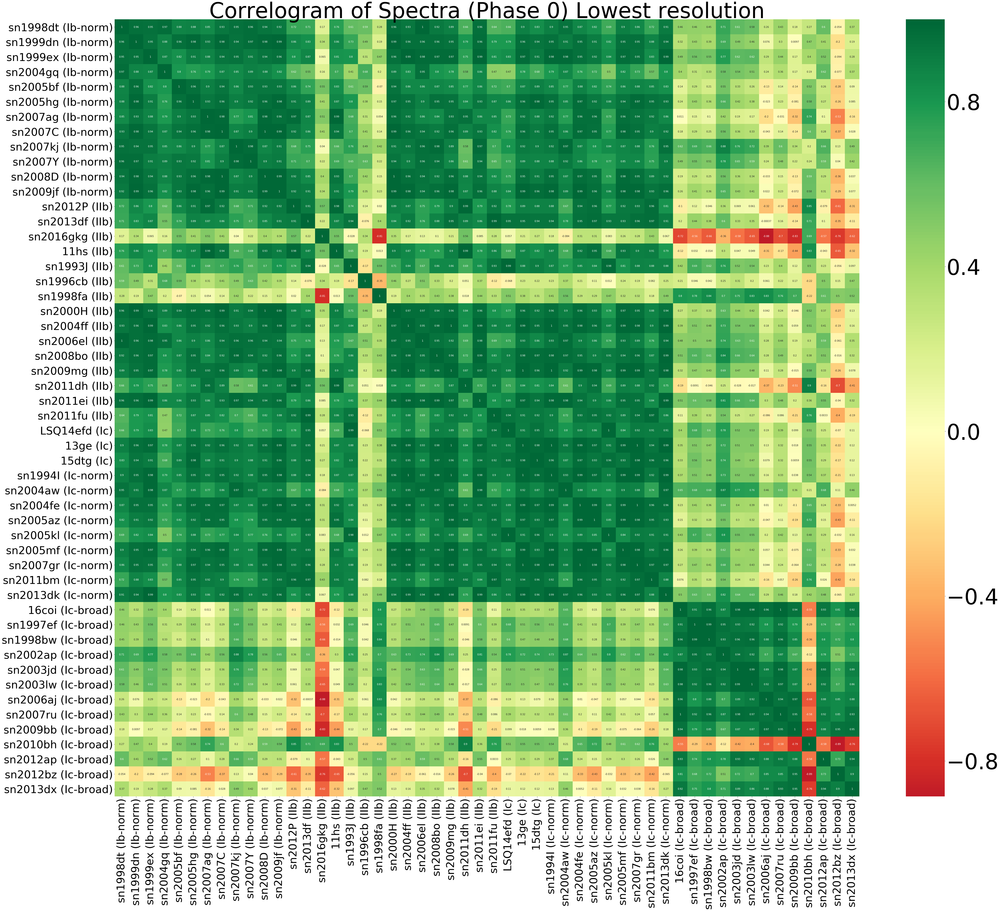

In [21]:
bin_length = get_bin_length(0, 82)
dataset = remove_sne(loaddata(0))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 0) Lowest resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [22]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.932361
Average Ib-IIb Correlation: 0.816073
Average Ib-Ic Correlation: 0.914669
Average Ib-Icbl Correlation: 0.326827
Average IIb-IIb Correlation: 0.708521
Average IIb-Ic Correlation: 0.821432
Average IIb-Icbl Correlation: 0.209664
Average Ic-Ic Correlation: 0.931879
Average Ic-Icbl Correlation: 0.259971
Average Icbl-Icbl Correlation: 0.654179


## 2. Phase: 5 $\pm$ 5 days after peak

## 2.1 Full resolution

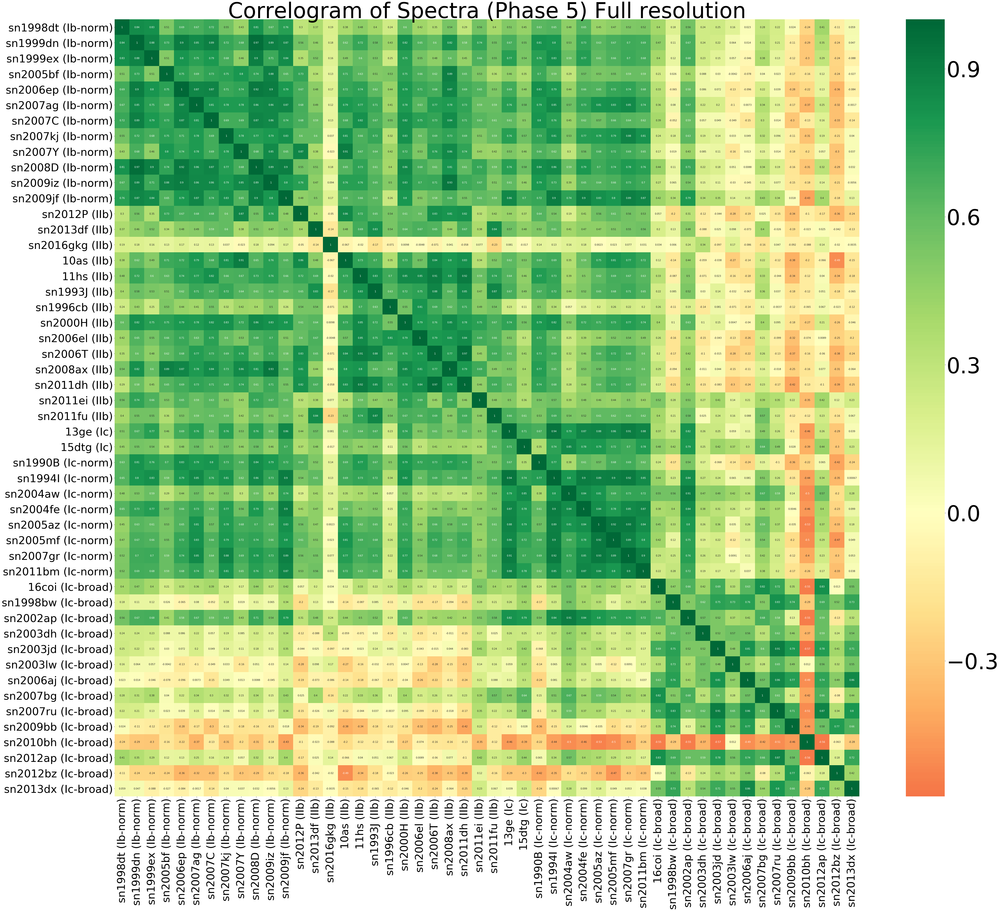

In [23]:
bin_length = get_bin_length(5, 1)
dataset = remove_sne(loaddata(5))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 5) Full resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [24]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.770658
Average Ib-IIb Correlation: 0.581018
Average Ib-Ic Correlation: 0.665823
Average Ib-Icbl Correlation: 0.095788
Average IIb-IIb Correlation: 0.574632
Average IIb-Ic Correlation: 0.511616
Average IIb-Icbl Correlation: 0.010613
Average Ic-Ic Correlation: 0.782727
Average Ic-Icbl Correlation: 0.180297
Average Icbl-Icbl Correlation: 0.419865


## 2.2 Lowest resolution

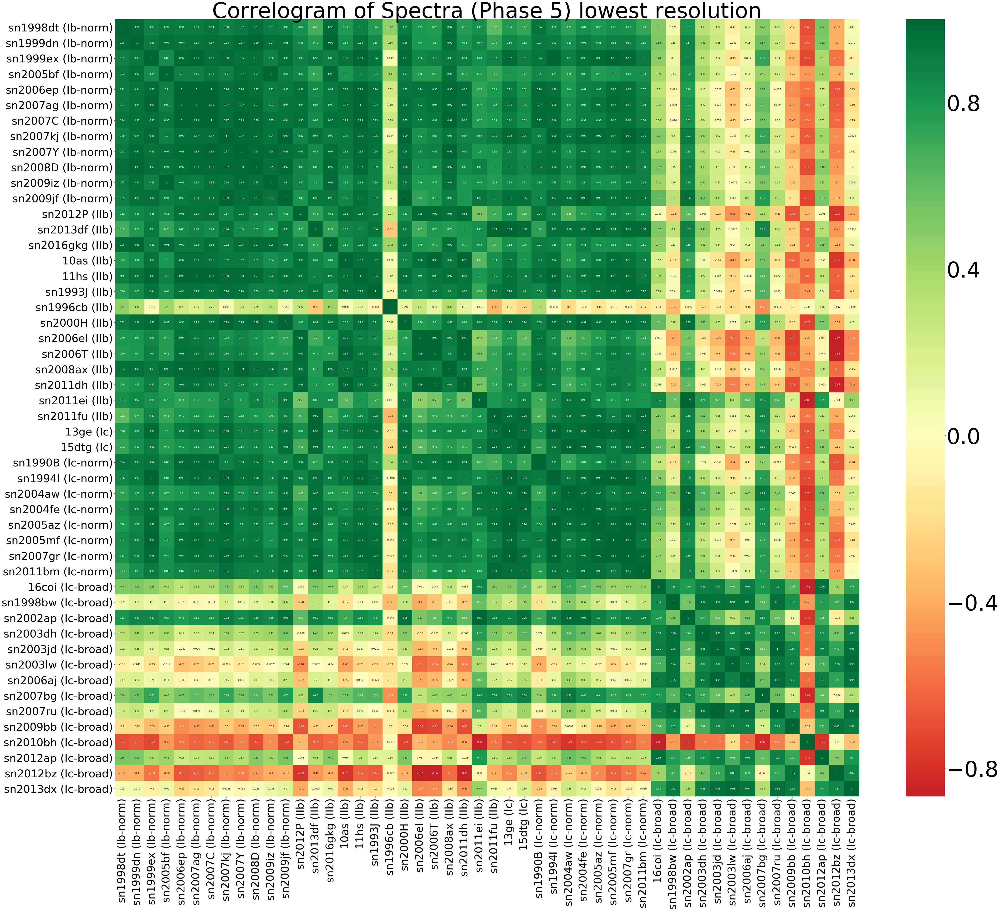

In [25]:
bin_length = get_bin_length(5, 82)
dataset = remove_sne(loaddata(5))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 5) lowest resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [26]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.967310
Average Ib-IIb Correlation: 0.879538
Average Ib-Ic Correlation: 0.962275
Average Ib-Icbl Correlation: 0.181615
Average IIb-IIb Correlation: 0.798515
Average IIb-Ic Correlation: 0.880608
Average IIb-Icbl Correlation: 0.072623
Average Ic-Ic Correlation: 0.958647
Average Ic-Icbl Correlation: 0.135224
Average Icbl-Icbl Correlation: 0.554562


## 3. Phase: 10 $\pm$ 5 days after peak

## 3.1 Full resolution

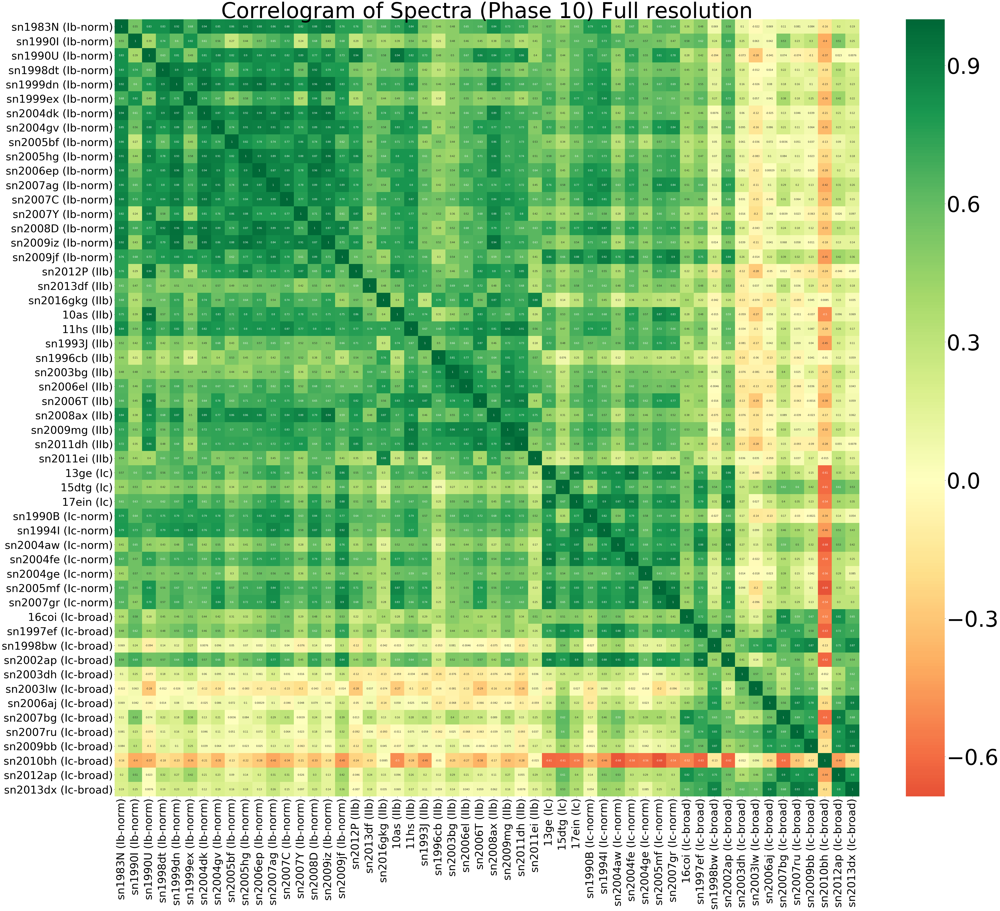

In [27]:
bin_length = get_bin_length(10, 1)
dataset = remove_sne(loaddata(10))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 10) Full resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [28]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.790639
Average Ib-IIb Correlation: 0.624820
Average Ib-Ic Correlation: 0.636551
Average Ib-Icbl Correlation: 0.176176
Average IIb-IIb Correlation: 0.677427
Average IIb-Ic Correlation: 0.525888
Average IIb-Icbl Correlation: 0.096479
Average Ic-Ic Correlation: 0.752040
Average Ic-Icbl Correlation: 0.280201
Average Icbl-Icbl Correlation: 0.479655


## 3.2 Lowest resolution

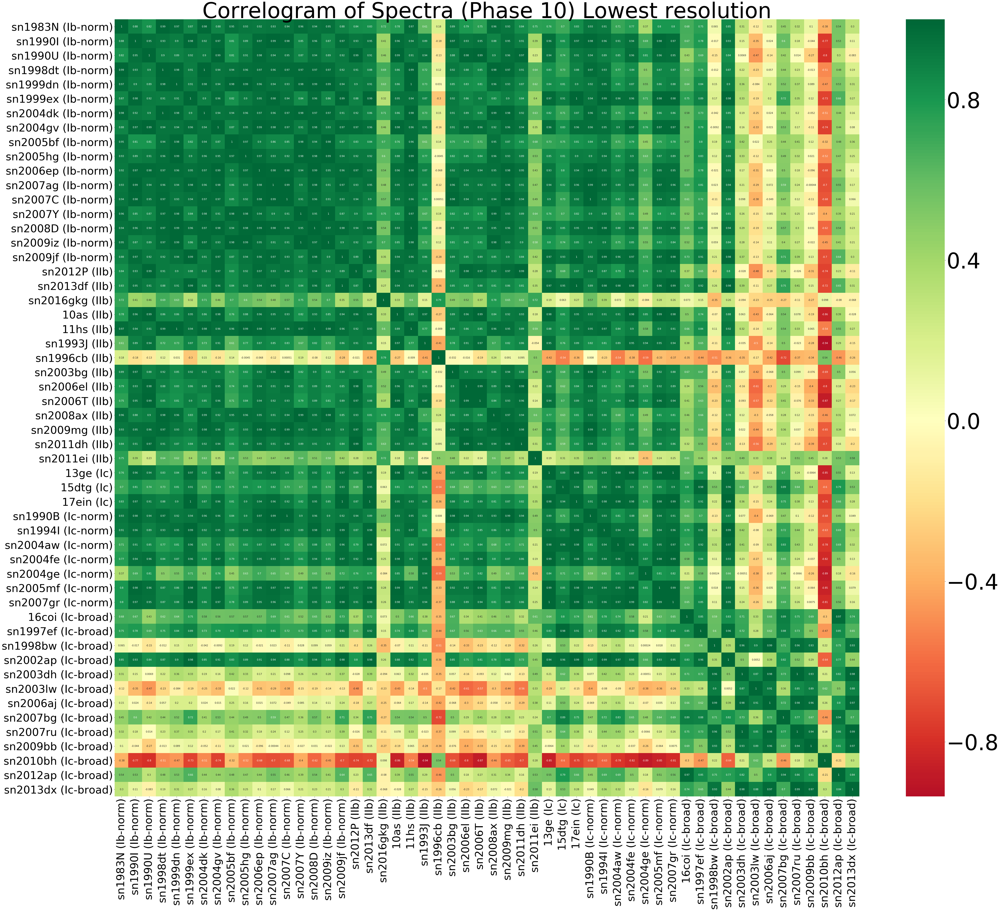

In [29]:
bin_length = get_bin_length(10, 82)
dataset = remove_sne(loaddata(10))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 10) Lowest resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [30]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.960126
Average Ib-IIb Correlation: 0.782765
Average Ib-Ic Correlation: 0.931383
Average Ib-Icbl Correlation: 0.392591
Average IIb-IIb Correlation: 0.625152
Average IIb-Ic Correlation: 0.759901
Average IIb-Icbl Correlation: 0.262429
Average Ic-Ic Correlation: 0.923753
Average Ic-Icbl Correlation: 0.278322
Average Icbl-Icbl Correlation: 0.631699


## 4. Phase: 15 $\pm$ 5 days after peak

## 4.1 Full resolution

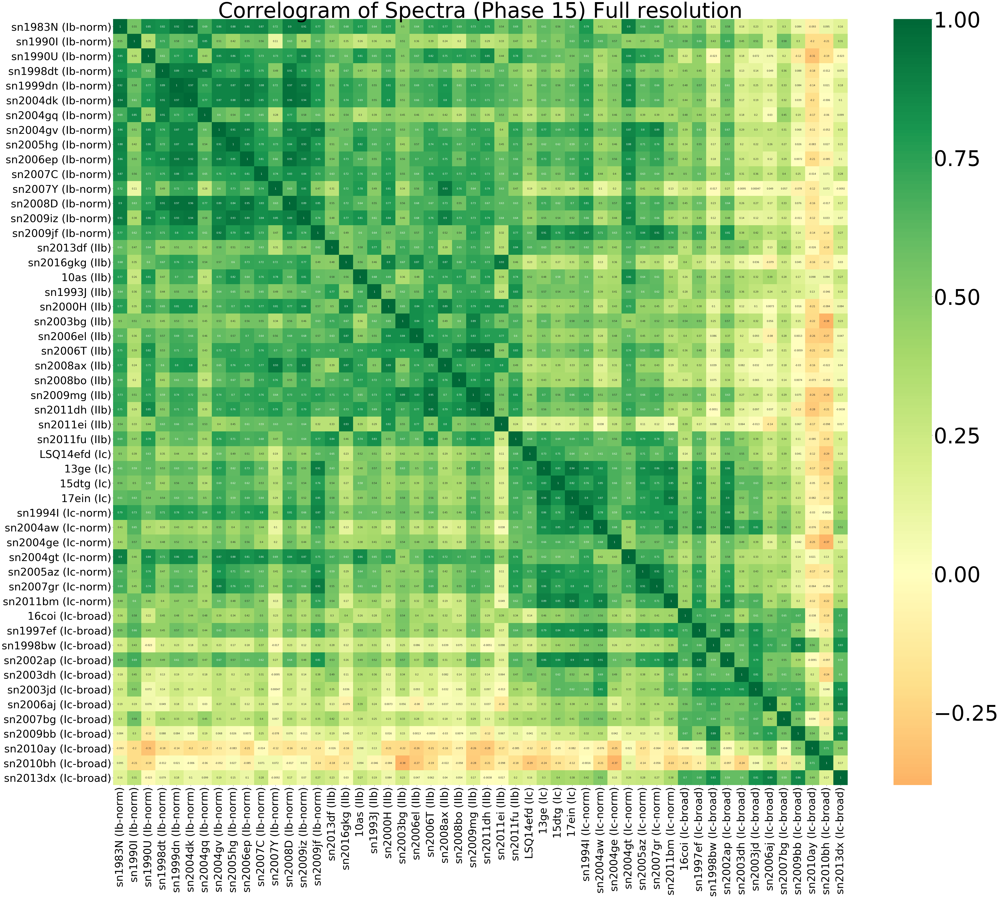

In [31]:
bin_length = get_bin_length(15, 1)
dataset = remove_sne(loaddata(15))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 15) Full resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [32]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.757842
Average Ib-IIb Correlation: 0.617697
Average Ib-Ic Correlation: 0.581214
Average Ib-Icbl Correlation: 0.224230
Average IIb-IIb Correlation: 0.684792
Average IIb-Ic Correlation: 0.477487
Average IIb-Icbl Correlation: 0.170863
Average Ic-Ic Correlation: 0.723606
Average Ic-Icbl Correlation: 0.360972
Average Icbl-Icbl Correlation: 0.501537


## 4.2 Lowest resolution

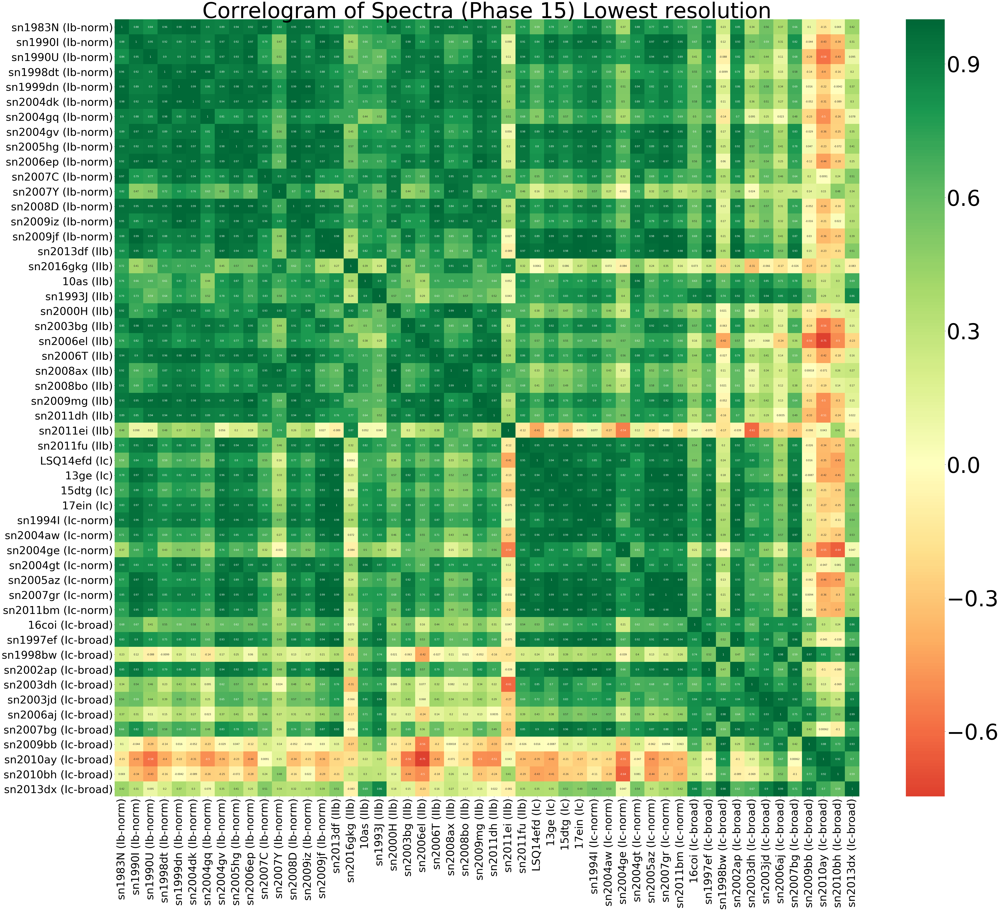

In [33]:
bin_length = get_bin_length(15, 82)
dataset = remove_sne(loaddata(15))
dataframe = Dataset_df(dataset, bin_length)

plt.figure(figsize=(70,60))
ax = seaborn.heatmap(dataframe.corr(), xticklabels = dataframe.corr().columns, yticklabels = dataframe.corr().columns, cmap='RdYlGn', center = 0, annot = True)

plt.title('Correlogram of Spectra (Phase 15) Lowest resolution', fontsize=90)
plt.xticks(rotation = 90, fontsize=45)
plt.yticks(rotation = 0, fontsize=45)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=90)
plt.show()

### Average Pairwise Correlation:

In [34]:
av_corr_subtypes(dataset, bin_length)

Average Ib-Ib Correlation: 0.907980
Average Ib-IIb Correlation: 0.836088
Average Ib-Ic Correlation: 0.891023
Average Ib-Icbl Correlation: 0.537800
Average IIb-IIb Correlation: 0.751314
Average IIb-Ic Correlation: 0.800884
Average IIb-Icbl Correlation: 0.526875
Average Ic-Ic Correlation: 0.930269
Average Ic-Icbl Correlation: 0.443944
Average Icbl-Icbl Correlation: 0.612802


# Summary: I checked the correlation of spectra in all four datasets corresponding to 4 phases at both the original (Full) and our lowest resolution. The spectra remain corellated even at lowest resolution which explains higher SVM scores at lower resolutions.